
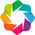

In [1]:
import matplotlib
import poloniex
import datetime
import holoviews as hv
from holoviews.operation.timeseries import rolling, rolling_outlier_std
from holoviews.streams import Stream
hv.notebook_extension('bokeh')

## Fetching and Visualizing data

In [2]:
import backtrader
import pandas as pd
# hv.notebook_extension('matplotlib')

Let's Download some OHLC series:

In [3]:
end = datetime.datetime.now()
start = end - datetime.timedelta(days=364)
ether = poloniex.get_ohlc('USDT_ETH',start, end)
btc = poloniex.get_ohlc('USDT_BTC', start,end)
ltc = poloniex.get_ohlc('USDT_LTC', start,end)

In [4]:
ether.describe()

,close,high,low,open,quoteVolume,volume,weightedAverage
count,104831.000000,104831.000000,104831.000000,104831.000000,104831.000000,1.048310e+05,104831.000000
mean,210.774254,211.403849,210.110297,210.783910,223.726028,4.582326e+04,210.756125
std,172.654419,173.252326,172.009873,172.666613,463.997951,9.502708e+04,172.633336
min,7.100000,7.100000,7.100000,7.100000,0.000000,0.000000e+00,7.100000
25%,44.485255,44.581918,44.361050,44.491032,18.597767,1.724321e+03,44.474534
50%,227.869000,228.568348,227.100070,227.890623,78.010659,1.324423e+04,227.870967
75%,306.692618,307.349860,306.000000,306.699325,230.476541,4.817418e+04,306.623500
max,862.709084,865.000000,860.009085,862.709084,13335.125868,2.630736e+06,863.631067


In [5]:
def load_symbol(symbol, **kwargs):
    df = data[symbol]
    df.reset_index(level=0, inplace=True)
    return hv.Curve(df, ('date', 'Date'), ('close', 'Close price'))


data = {"ETH": ether, 'BTC':btc, 'LTC':ltc}
dmap = hv.DynamicMap(load_symbol, kdims='Symbol').redim.values(Symbol=list(data.keys()))

In [6]:
%%opts Curve [width=600] {+framewise}
dmap

:DynamicMap   [Symbol]

In [7]:
%%opts Scatter [width=600] (color='black')
smoothed = dmap*rolling(dmap, rolling_window=30)*rolling_outlier_std(dmap)
smoothed

:DynamicMap   [Symbol]

# Creating a strategy

From now on we are going to use the [backtrader](https://www.backtrader.com/docu/index.html) library to implent algirithmic strategies to trade Ether. 

In [8]:
import backtrader as bt
import backtrader.indicators as btind
import backtrader.analyzers as btanalyzers

In [9]:
def run_test():
    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
    res = cerebro.run()
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    return res

In [56]:
class SMA_CrossOver(backtrader.Strategy):

    params = (('fast', 12), ('slow', 26))

    def __init__(self):
        self.rsi = btind.RSI()
        sma_fast = btind.SMA(period=self.p.fast)
        sma_slow = btind.SMA(period=self.p.slow)

        self.buysig = btind.CrossOver(sma_fast, sma_slow)

    def next(self):
        if self.position.size:
#             if (self.buysig < 0):
#                 self.sell()

#       elif (self.buysig > 0):
#                 self.buy()
            if (self.rsi<=50):
                self.sell()

        elif (self.rsi>=60):
            self.buy()
            
class Aroon(backtrader.Strategy):
    params = (('period',70),)
    def __init__(self):
        self.a_up = btind.AroonUp(period=self.p.period)
        self.a_down = btind.AroonDown(period=self.p.period)
    def next(self):
        if self.position.size:
            if self.a_down >= 95:
                self.sell()
        elif self.a_up >=97:
            self.buy()

UsageError: Cell magic `%%hide` not found.


In [48]:
class DeltaStrat(backtrader.Strategy):
    def __init__(self):
        self.delta = 20
        self.price_in = None
        self.price_out = 100000
        self.trailing = 0.5
        self.target = 10000000
        self.order = None
        print(self.position.size)
        
    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))
    
    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enougth cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    'BUY EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f, %.2f' %
                    (order.executed.price,
                     order.executed.value,
                     order.executed.comm,
                     self.price_out))

                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else:  # Sell
                self.log('SELL EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                         (order.executed.price,
                          order.executed.value,
                          order.executed.comm))

            self.bar_executed = len(self)

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None
        
    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))
        
    def next(self):
        self.price_out = self.data.close[0] if self.price_out is None else self.price_out
        for data in self.datas:
            curpos = self.getposition(data)
            if curpos.size:

                if self.data.close[0] - self.price_in >= self.delta:
                    size = curpos.size // 5 if curpos.size > 30 else curpos.size
                    self.order = self.sell(data=data, size=size)
                    self.price_out = self.data.close[0]

            if self.data.close[0] - self.price_out <= -self.delta:
                self.order = self.buy(data=data,
                                      exectype=bt.Order.Limit, 
                                      price=self.data.close[0] * 0.98)
                self.price_in = self.data.close[0]
            if curpos.size <= 30:
                self.order = self.buy(data=data,
                                      exectype=bt.Order.Limit, 
                                      price=self.data.close[0] * 0.98)
                self.price_in = self.data.close[0]

In [49]:
cerebro = backtrader.Cerebro()
cerebro.broker.setcash(100000.0)
data2 = backtrader.feeds.PandasData(dataname=ether[-10000:], datetime='date',)
cerebro.adddata(data2)
cerebro.broker.setcommission(commission=0.001)
cerebro.addsizer(backtrader.sizers.FixedSize, stake=30)
# cerebro.addstrategy(SMA_CrossOver)
cerebro.addstrategy(DeltaStrat)
cerebro.addanalyzer(bt.analyzers.PyFolio)
cerebro.addanalyzer(btanalyzers.SharpeRatio, _name='mysharpe')
res = run_test()
print('Sharpe Ratio:', res[0].analyzers.mysharpe.get_analysis())

Starting Portfolio Value: 100000.00
0
2017-11-23, BUY EXECUTED, Price: 376.04, Cost: 11281.30, Comm 11.28, 100000.00
2017-11-23, BUY EXECUTED, Price: 376.04, Cost: 11281.30, Comm 11.28, 100000.00
2017-11-23, BUY EXECUTED, Price: 375.34, Cost: 11260.20, Comm 11.26, 100000.00
2017-11-23, BUY EXECUTED, Price: 375.34, Cost: 11260.20, Comm 11.26, 100000.00
2017-11-23, BUY EXECUTED, Price: 375.54, Cost: 11266.08, Comm 11.27, 100000.00
2017-11-23, BUY EXECUTED, Price: 375.54, Cost: 11266.08, Comm 11.27, 100000.00
2017-11-23, BUY EXECUTED, Price: 374.71, Cost: 11241.16, Comm 11.24, 100000.00
2017-11-23, BUY EXECUTED, Price: 374.71, Cost: 11241.16, Comm 11.24, 100000.00
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Ma

2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23, Order Canceled/Margin/Rejected
2017-11-23,

2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24, Order Canceled/Margin/Rejected
2017-11-24,

2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25,

2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25, Order Canceled/Margin/Rejected
2017-11-25,

2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26, Order Canceled/Margin/Rejected
2017-11-26,

2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27,

2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27, Order Canceled/Margin/Rejected
2017-11-27,

2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28, Order Canceled/Margin/Rejected
2017-11-28,

2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29,

2017-11-29, BUY EXECUTED, Price: 409.26, Cost: 12277.74, Comm 12.28, 442.20
2017-11-29, BUY EXECUTED, Price: 405.72, Cost: 12171.60, Comm 12.17, 442.20
2017-11-29, BUY EXECUTED, Price: 411.50, Cost: 12345.06, Comm 12.35, 442.20
2017-11-29, BUY EXECUTED, Price: 410.33, Cost: 12310.04, Comm 12.31, 442.20
2017-11-29, BUY EXECUTED, Price: 411.60, Cost: 12348.00, Comm 12.35, 442.20
2017-11-29, BUY EXECUTED, Price: 413.56, Cost: 12406.80, Comm 12.41, 442.20
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-29, Order Canceled/Margin/Rejected
2017-11-30, Order Canceled/Margin/Rejected
2017-11-30, Order Canceled/Margin/Rejected
2017-11-30, Order Canceled/Margin/Rejected
2017-11-30, SELL EXECUTED, Price: 444.22, Cost: 22458.18, Comm 23.99
2017-11-30, SELL EXECUTED, Price: 444.44, Cost: 17883.37, Comm 19.11
2017-11-30, SELL EXECUTED, Price: 447.00, Cost: 14140.34, Comm 15.20
2017-11-30, SELL EXECUTED, Price: 44

2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01, Order Canceled/Margin/Rejected
2017-12-01,

2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-03, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04, Order Canceled/Margin/Rejected
2017-12-04,

2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05, Order Canceled/Margin/Rejected
2017-12-05,

2017-12-06, BUY EXECUTED, Price: 434.83, Cost: 13044.78, Comm 13.04, 437.66
2017-12-06, BUY EXECUTED, Price: 433.29, Cost: 12998.72, Comm 13.00, 437.66
2017-12-06, BUY EXECUTED, Price: 433.16, Cost: 12994.80, Comm 12.99, 437.66
2017-12-06, BUY EXECUTED, Price: 433.16, Cost: 12994.80, Comm 12.99, 437.66
2017-12-06, BUY EXECUTED, Price: 432.57, Cost: 12977.19, Comm 12.98, 437.66
2017-12-06, BUY EXECUTED, Price: 432.39, Cost: 12971.81, Comm 12.97, 437.66
2017-12-06, BUY EXECUTED, Price: 428.91, Cost: 12867.16, Comm 12.87, 437.66
2017-12-06, BUY EXECUTED, Price: 428.54, Cost: 12856.16, Comm 12.86, 437.66
2017-12-06, BUY EXECUTED, Price: 428.57, Cost: 12857.21, Comm 12.86, 437.66
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Order Canceled/Margin/Rejected
2017-12-06, Ord

2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07, Order Canceled/Margin/Rejected
2017-12-07,

2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, Order Canceled/Margin/Rejected
2017-12-08, SELL EXECUTED, Price: 437.07, Cost: 25688.05, Comm 26.22
2017-12-08, SELL EXECUTED, Price: 440.01, Cost: 20550.44, Comm 21.12
2017-12-08, SELL EXECUTED, Price: 439.78, Cost: 16269.10, Comm 16.71
2017-12-08, SELL EXECUTED, Price: 437.50, Cost: 12844.02, Comm 13.13
2017-12-08, SELL EXECUTED, Price: 441.80, Cost: 10275.22, Comm 10.60
2017-12-08, SELL EXECUTED, Price: 442.00, Cost: 8562.68, Comm 8.84
2017-12-08, SELL EXECUTED, Price: 440.01, Cost: 6850.15, Comm 7.04
2017-12-08, SELL EXECUTED, Price: 438.55, Cost: 5137.61, Comm 5.26
2017-12-08, SELL EXECUTED, Price: 436.41, Cost: 4281.34, Comm 4.36


2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10, Order Canceled/Margin/Rejected
2017-12-10,

2017-12-12, SELL EXECUTED, Price: 545.50, Cost: 6189.76, Comm 6.55
2017-12-12, SELL EXECUTED, Price: 549.00, Cost: 4642.32, Comm 4.94
2017-12-12, SELL EXECUTED, Price: 548.00, Cost: 3610.69, Comm 3.84
2017-12-12, SELL EXECUTED, Price: 555.00, Cost: 3094.88, Comm 3.33
2017-12-12, SELL EXECUTED, Price: 567.00, Cost: 13411.14, Comm 14.74
2017-12-12, BUY EXECUTED, Price: 553.13, Cost: 16593.76, Comm 16.59, 564.41
2017-12-12, OPERATION PROFIT, GROSS 2446.21, NET 2381.86
2017-12-12, BUY EXECUTED, Price: 588.00, Cost: 17640.00, Comm 17.64, 564.41
2017-12-12, SELL EXECUTED, Price: 628.94, Cost: 6846.75, Comm 7.55
2017-12-12, BUY EXECUTED, Price: 587.42, Cost: 17622.67, Comm 17.62, 628.95
2017-12-12, BUY EXECUTED, Price: 592.90, Cost: 17787.00, Comm 17.79, 628.95
2017-12-12, BUY EXECUTED, Price: 590.87, Cost: 17726.12, Comm 17.73, 628.95
2017-12-12, BUY EXECUTED, Price: 593.88, Cost: 17816.40, Comm 17.82, 628.95
2017-12-12, BUY EXECUTED, Price: 591.59, Cost: 17747.60, Comm 17.75, 628.95
2017-12

2017-12-13, BUY EXECUTED, Price: 682.08, Cost: 20462.40, Comm 20.46, 696.00
2017-12-13, BUY EXECUTED, Price: 684.04, Cost: 20521.20, Comm 20.52, 696.00
2017-12-13, BUY EXECUTED, Price: 662.48, Cost: 19874.40, Comm 19.87, 696.00
2017-12-13, BUY EXECUTED, Price: 655.61, Cost: 19668.18, Comm 19.67, 696.00
2017-12-13, BUY EXECUTED, Price: 653.37, Cost: 19600.98, Comm 19.60, 696.00
2017-12-13, BUY EXECUTED, Price: 656.40, Cost: 19692.09, Comm 19.69, 696.00
2017-12-13, BUY EXECUTED, Price: 655.94, Cost: 19678.32, Comm 19.68, 696.00
2017-12-13, BUY EXECUTED, Price: 659.48, Cost: 19784.38, Comm 19.78, 696.00
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-12-13, Order Canceled/Margin/Rejected
2017-

2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14, Order Canceled/Margin/Rejected
2017-12-14,

2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15,

2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15, Order Canceled/Margin/Rejected
2017-12-15,

2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16, Order Canceled/Margin/Rejected
2017-12-16,

2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17, Order Canceled/Margin/Rejected
2017-12-17,

2017-12-18, SELL EXECUTED, Price: 734.80, Cost: 38748.01, Comm 39.68
2017-12-18, SELL EXECUTED, Price: 733.00, Cost: 30854.89, Comm 31.52
2017-12-18, SELL EXECUTED, Price: 732.32, Cost: 24396.89, Comm 24.90
2017-12-18, SELL EXECUTED, Price: 733.20, Cost: 19374.00, Comm 19.80
2017-12-18, SELL EXECUTED, Price: 735.10, Cost: 15786.22, Comm 16.17
2017-12-18, SELL EXECUTED, Price: 734.31, Cost: 12916.00, Comm 13.22
2017-12-18, SELL EXECUTED, Price: 735.00, Cost: 10045.78, Comm 10.29
2017-12-18, SELL EXECUTED, Price: 733.00, Cost: 7893.11, Comm 8.06
2017-12-18, SELL EXECUTED, Price: 731.15, Cost: 6458.00, Comm 6.58
2017-12-18, SELL EXECUTED, Price: 732.20, Cost: 5022.89, Comm 5.13
2017-12-18, SELL EXECUTED, Price: 735.00, Cost: 4305.33, Comm 4.41
2017-12-18, SELL EXECUTED, Price: 741.52, Cost: 17938.89, Comm 18.54
2017-12-18, OPERATION PROFIT, GROSS 4549.85, NET 4157.82
2017-12-18, BUY EXECUTED, Price: 770.28, Cost: 23108.40, Comm 23.11, 741.00
2017-12-18, BUY EXECUTED, Price: 769.69, Cost: 

2017-12-19, BUY EXECUTED, Price: 784.10, Cost: 23522.96, Comm 23.52, 827.07
2017-12-19, BUY EXECUTED, Price: 784.98, Cost: 23549.40, Comm 23.55, 827.07
2017-12-19, BUY EXECUTED, Price: 787.92, Cost: 23637.60, Comm 23.64, 827.07
2017-12-19, BUY EXECUTED, Price: 788.90, Cost: 23667.00, Comm 23.67, 827.07
2017-12-19, BUY EXECUTED, Price: 774.21, Cost: 23226.29, Comm 23.23, 827.07
2017-12-19, BUY EXECUTED, Price: 777.38, Cost: 23321.55, Comm 23.32, 827.07
2017-12-19, BUY EXECUTED, Price: 764.40, Cost: 22932.00, Comm 22.93, 827.07
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Rejected
2017-12-19, Order Canceled/Margin/Reje

2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20, Order Canceled/Margin/Rejected
2017-12-20,

2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21, Order Canceled/Margin/Rejected
2017-12-21,

2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, SELL EXECUTED, Price: 635.65, Cost: 36876.72, Comm 34.33
2017-12-22, BUY EXECUTED, Price: 597.31, Cost: 17919.30, Comm 17.92, 634.00
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Rejected
2017-12-22, Order Canceled/Margin/Reje

2017-12-22, SELL EXECUTED, Price: 677.15, Cost: 19537.76, Comm 20.31
2017-12-22, BUY EXECUTED, Price: 634.68, Cost: 19040.49, Comm 19.04, 677.99
2017-12-22, BUY EXECUTED, Price: 630.38, Cost: 18911.55, Comm 18.91, 677.99
2017-12-22, BUY EXECUTED, Price: 621.32, Cost: 18639.60, Comm 18.64, 677.99
2017-12-23, BUY EXECUTED, Price: 639.45, Cost: 19183.47, Comm 19.18, 677.99
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Canceled/Margin/Rejected
2017-12-23, Order Cancele

2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24,

2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-24, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25, Order Canceled/Margin/Rejected
2017-12-25,

2017-12-26, SELL EXECUTED, Price: 740.58, Cost: 33939.35, Comm 35.55
2017-12-26, SELL EXECUTED, Price: 744.25, Cost: 26868.65, Comm 28.28
2017-12-26, SELL EXECUTED, Price: 744.89, Cost: 21212.09, Comm 22.35
2017-12-26, SELL EXECUTED, Price: 745.33, Cost: 16969.67, Comm 17.89
2017-12-26, SELL EXECUTED, Price: 744.59, Cost: 14141.40, Comm 14.89
2017-12-26, SELL EXECUTED, Price: 740.00, Cost: 11313.12, Comm 11.84
2017-12-26, SELL EXECUTED, Price: 740.34, Cost: 8484.84, Comm 8.88
2017-12-26, SELL EXECUTED, Price: 742.56, Cost: 7070.70, Comm 7.43
2017-12-26, SELL EXECUTED, Price: 742.30, Cost: 5656.56, Comm 5.94
2017-12-26, SELL EXECUTED, Price: 740.89, Cost: 4242.42, Comm 4.45
2017-12-26, BUY EXECUTED, Price: 734.89, Cost: 22046.77, Comm 22.05, 740.89
2017-12-26, BUY EXECUTED, Price: 734.89, Cost: 22046.77, Comm 22.05, 740.89
2017-12-26, BUY EXECUTED, Price: 734.75, Cost: 22042.36, Comm 22.04, 740.89
2017-12-26, BUY EXECUTED, Price: 732.73, Cost: 21981.93, Comm 21.98, 740.89
2017-12-26, BU

<IPython.core.display.Javascript object>


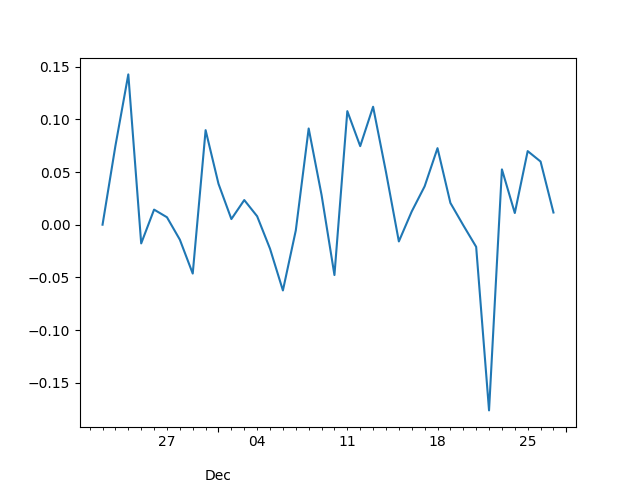

<IPython.core.display.Javascript object>


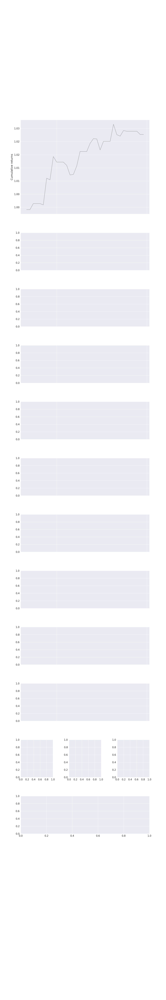

<IPython.core.display.Javascript object>


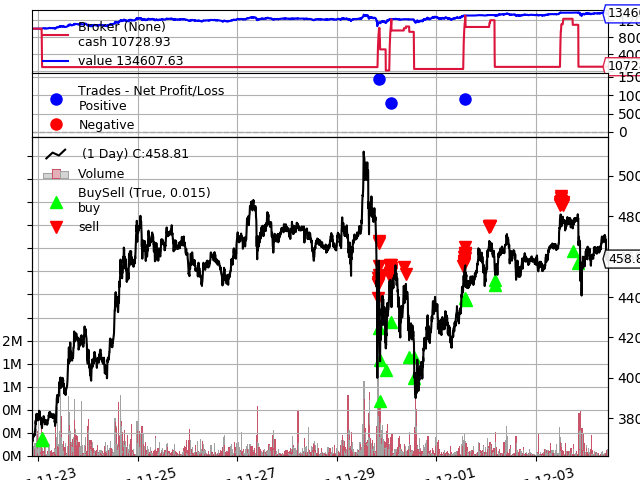

<IPython.core.display.Javascript object>


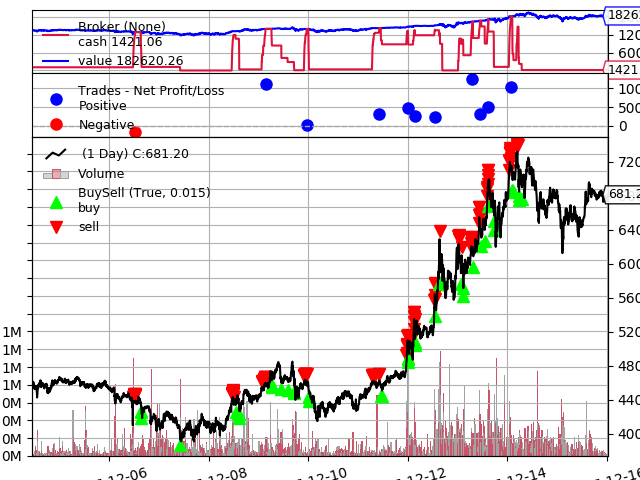

<IPython.core.display.Javascript object>


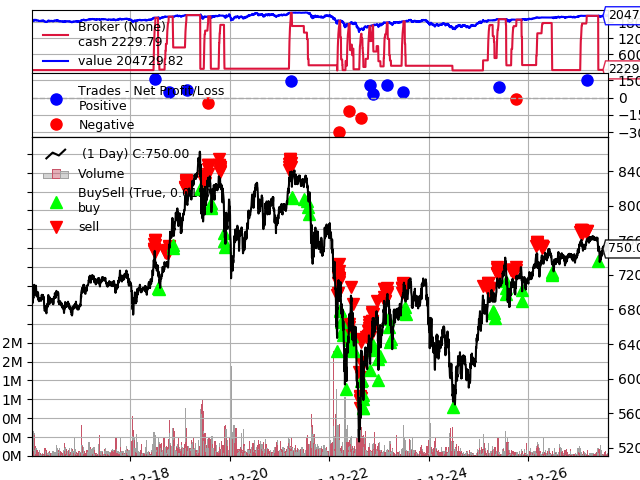

In [57]:
cerebro.plot(numfigs=3);

In [51]:
pyfoliozer = res[0].analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()

In [53]:
returns.plot()

In [54]:
import pyfolio as pf
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
     #gross_lev=gross_lev,
    live_start_date='2017-01-01',  # This date is sample specific
    round_trips=True
)


Entire data start date: 2017-11-22
Entire data end date: 2017-12-27
In-sample months: 0
Out-of-sample months: 1


,All,In-sample,Out-of-sample
Annual return,14975.4%,nan%,14975.4%
Cumulative returns,104.7%,nan%,104.7%
Annual volatility,93.2%,nan%,93.2%
Sharpe ratio,5.90,NaN,5.90
Calmar ratio,771.78,NaN,771.78
Stability,0.86,NaN,0.86
Max drawdown,-19.4%,nan%,-19.4%
Omega ratio,2.82,NaN,2.82
Sortino ratio,10.23,NaN,10.23
Skew,-0.71,NaN,-0.71


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:57: FutureWarning: 'argmin' is deprecated. Use 'idxmin' instead. The behavior of 'argmin' will be corrected to return the positional minimum in the future. Use 'series.values.argmin' to get the position of the minimum now.
  return getattr(obj, method)(*args, **kwds)


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.40,2017-12-19,2017-12-22,NaT,NaN
1,8.88,2017-12-04,2017-12-07,2017-12-09,5
2,5.99,2017-11-27,2017-11-29,2017-11-30,4
3,4.78,2017-12-09,2017-12-10,2017-12-11,1
4,1.78,2017-11-24,2017-11-25,2017-11-27,2


TypeError: Empty 'DataFrame': no numeric data to plot